In [2]:
import numpy as np
import pandas as pd


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
data = pd.read_csv('Training.csv')

In [4]:
data.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis,Unnamed: 133
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN


In [5]:


data['prognosis'].value_counts()

Fungal infection                           120
Hepatitis C                                120
Hepatitis E                                120
Alcoholic hepatitis                        120
Tuberculosis                               120
Common Cold                                120
Pneumonia                                  120
Dimorphic hemmorhoids(piles)               120
Heart attack                               120
Varicose veins                             120
Hypothyroidism                             120
Hyperthyroidism                            120
Hypoglycemia                               120
Osteoarthristis                            120
Arthritis                                  120
(vertigo) Paroymsal  Positional Vertigo    120
Acne                                       120
Urinary tract infection                    120
Psoriasis                                  120
Hepatitis D                                120
Hepatitis B                                120
Allergy      

In [7]:
data.columns

Index(['itching', 'skin_rash', 'nodal_skin_eruptions', 'continuous_sneezing',
       'shivering', 'chills', 'joint_pain', 'stomach_pain', 'acidity',
       'ulcers_on_tongue',
       ...
       'scurring', 'skin_peeling', 'silver_like_dusting',
       'small_dents_in_nails', 'inflammatory_nails', 'blister',
       'red_sore_around_nose', 'yellow_crust_ooze', 'prognosis',
       'Unnamed: 133'],
      dtype='object', length=134)

In [8]:
print(data.info())

print(data.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4920 entries, 0 to 4919
Columns: 134 entries, itching to Unnamed: 133
dtypes: float64(1), int64(132), object(1)
memory usage: 5.0+ MB
None
           itching    skin_rash  nodal_skin_eruptions  continuous_sneezing  \
count  4920.000000  4920.000000           4920.000000          4920.000000   
mean      0.137805     0.159756              0.021951             0.045122   
std       0.344730     0.366417              0.146539             0.207593   
min       0.000000     0.000000              0.000000             0.000000   
25%       0.000000     0.000000              0.000000             0.000000   
50%       0.000000     0.000000              0.000000             0.000000   
75%       0.000000     0.000000              0.000000             0.000000   
max       1.000000     1.000000              1.000000             1.000000   

         shivering       chills   joint_pain  stomach_pain      acidity  \
count  4920.000000  4920.000000  

In [10]:
data=data.drop('Unnamed: 133',axis=1)

In [13]:
missing_values = data.isnull().sum().sort_values(ascending=False)
print(missing_values)

itching                 0
spinning_movements      0
altered_sensorium       0
muscle_pain             0
irritability            0
                       ..
abdominal_pain          0
constipation            0
back_pain               0
pain_behind_the_eyes    0
prognosis               0
Length: 133, dtype: int64


C:\Users\hp\AppData\Local\Temp\ipykernel_15240\1146658717.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=symptom_counts.values, y=symptom_counts.index, palette='viridis')


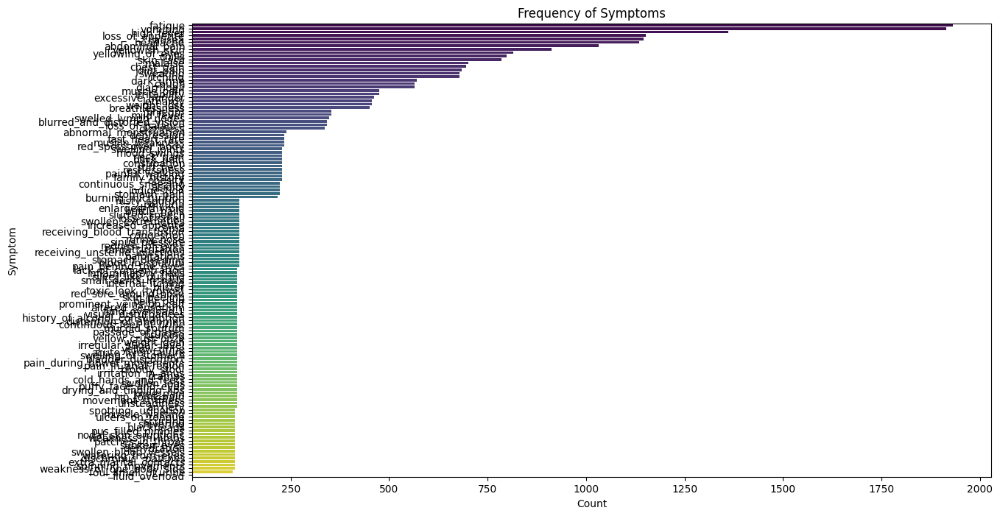

In [14]:
symptom_counts = data.drop(columns='prognosis').sum().sort_values(ascending=False)

# Plot the symptom frequencies
plt.figure(figsize=(14,8))
sns.barplot(x=symptom_counts.values, y=symptom_counts.index, palette='viridis')
plt.title('Frequency of Symptoms')
plt.xlabel('Count')
plt.ylabel('Symptom')
plt.show()

In [15]:
data.shape

(4920, 133)

C:\Users\hp\AppData\Local\Temp\ipykernel_15240\998733381.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


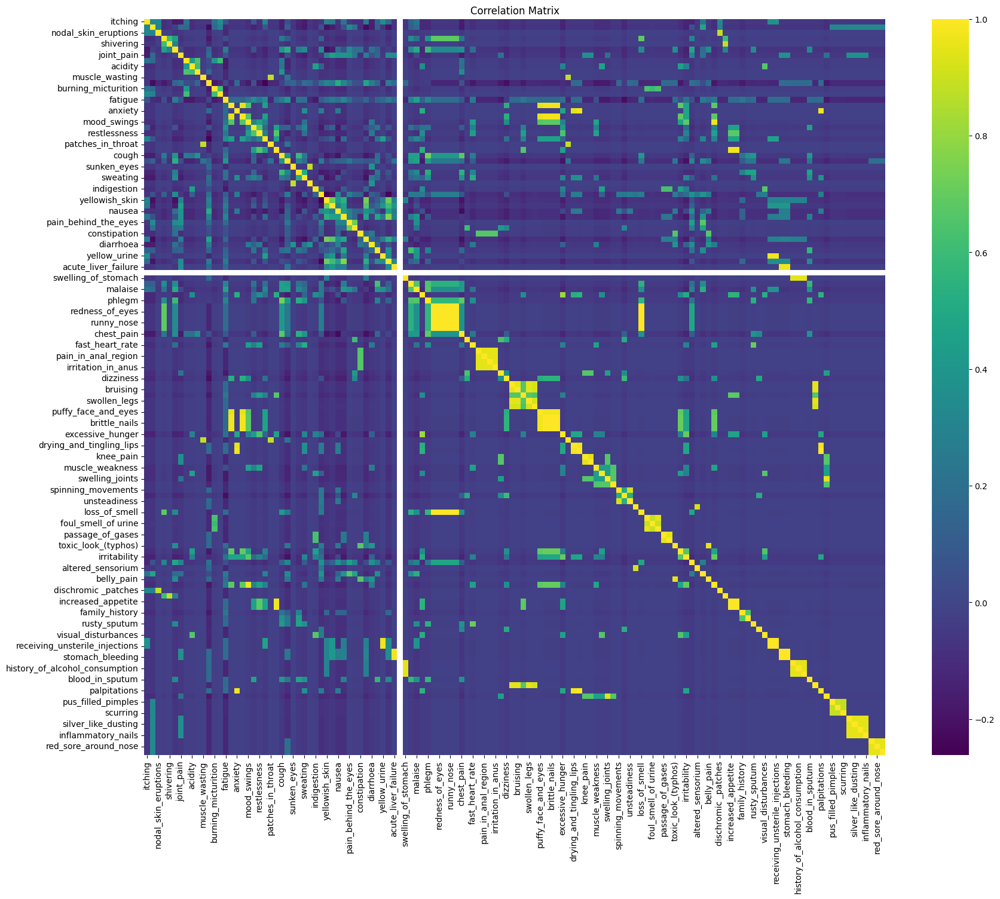

In [16]:
corr = data.corr()

# Plot the heatmap
plt.figure(figsize=(20,16))
sns.heatmap(corr, annot=False, cmap='viridis')
plt.title('Correlation Matrix')
plt.show()

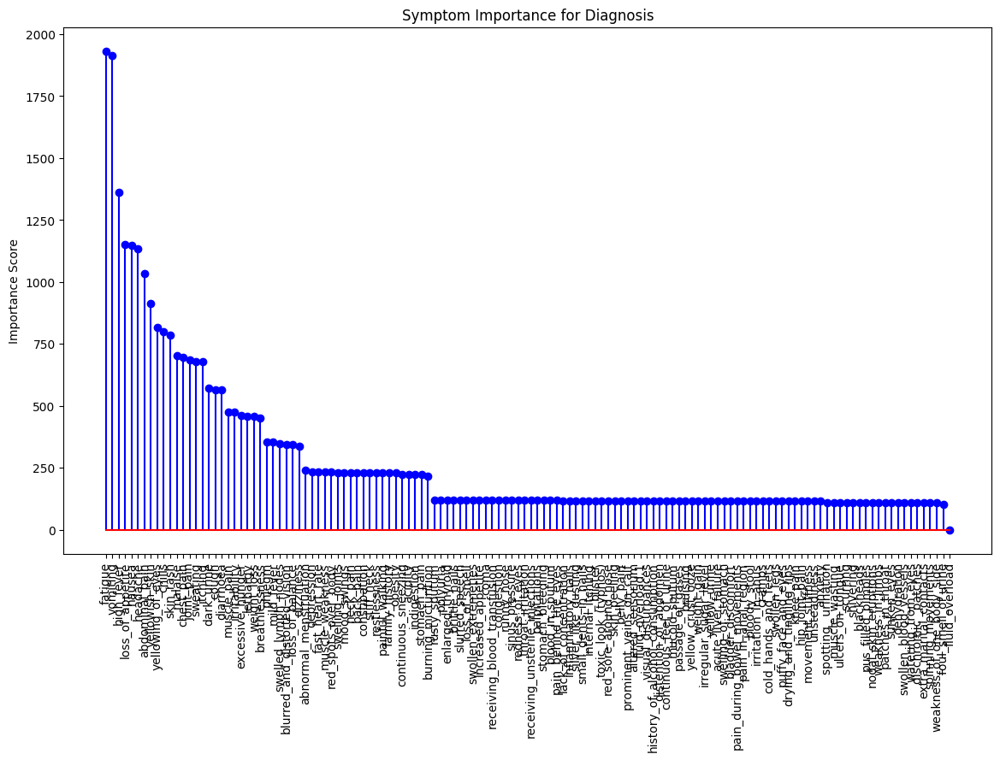

In [18]:
importance_scores = data.drop(columns='prognosis').sum().sort_values(ascending=False)

# Create a lollipop chart
plt.figure(figsize=(14,8))
plt.stem(importance_scores.index, importance_scores.values, linefmt='b-', markerfmt='bo', basefmt='r-')
plt.xticks(rotation=90)
plt.title('Symptom Importance for Diagnosis')
plt.ylabel('Importance Score')
plt.show()

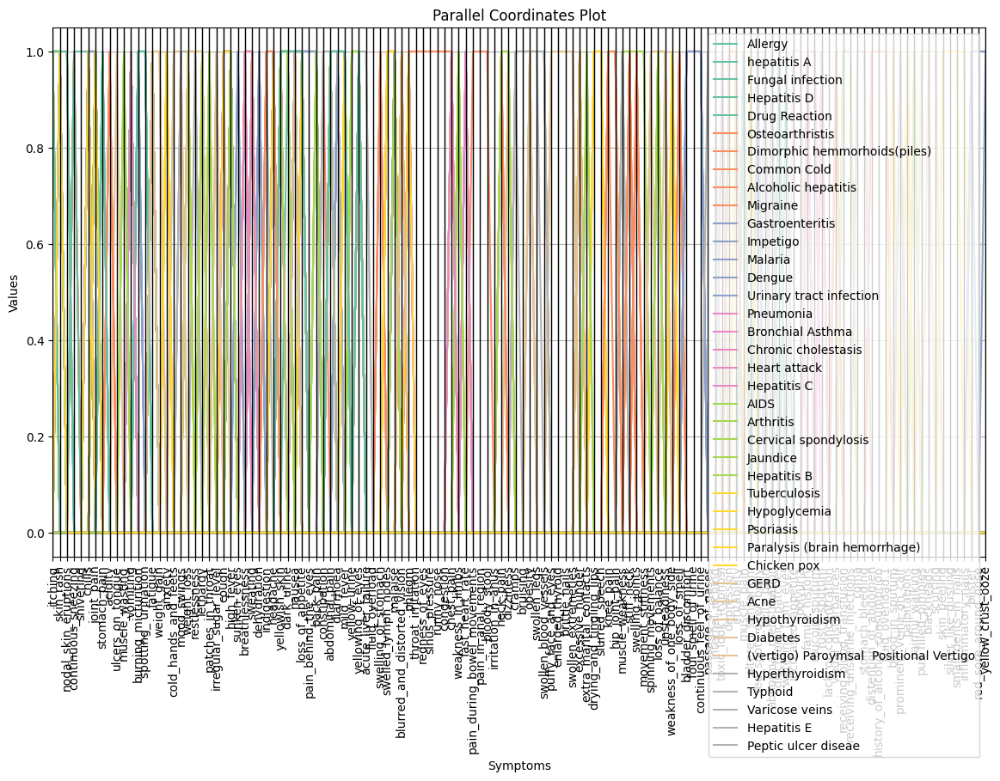

In [19]:
from pandas.plotting import parallel_coordinates

# Select a subset of the data for better visualization
subset = data.sample(200)

# Parallel coordinates plot
plt.figure(figsize=(14,8))
parallel_coordinates(subset, 'prognosis', colormap=plt.get_cmap("Set2"))
plt.title('Parallel Coordinates Plot')
plt.xlabel('Symptoms')
plt.ylabel('Values')
plt.xticks(rotation=90)
plt.show()

In [22]:
# Extract symptoms for each disease in the dataset
symptoms_dict = {}
for idx in range(len(data)):
    symptoms = []
    for key, value in data.iloc[idx].drop('prognosis').items():
        if value == 1:
            symptoms.append(key)
    disease = data.iloc[idx]['prognosis']
    if disease in symptoms_dict:
        symptoms_dict[disease].extend(symptoms)
    else:
        symptoms_dict[disease] = symptoms

# Print the symptoms for each disease
for disease, symptoms in symptoms_dict.items():
    print(f"{disease} => {symptoms}\n")


Fungal infection => ['itching', 'skin_rash', 'nodal_skin_eruptions', 'dischromic _patches', 'skin_rash', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'skin_rash', 'dischromic _patches', 'itching', 'skin_rash', 'nodal_skin_eruptions', 'skin_rash', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'skin_rash', 'dischromic _patches', 'itching', 'skin_rash', 'nodal_skin_eruptions', 'itching', 'skin_rash', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'skin_rash', 'nodal_skin_eruptions', 'dischromic _patches', 'skin_rash', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'skin_rash', 'dischromic _patches', 'itching', 'skin_rash', 'nodal_skin_eruptions', 'skin_rash', 'nodal_skin_eruptions', 'dischromic _patches', 'itching', 'nodal_skin_eruptions', 'dischromic _patches', 'itching'

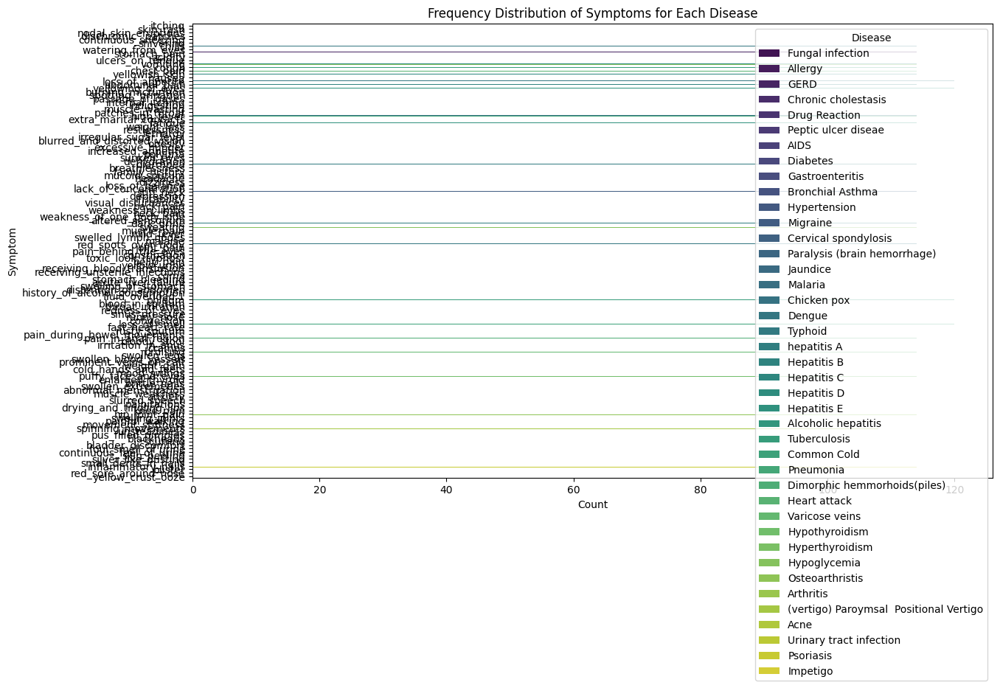

In [23]:
symptom_data = []
for disease, symptoms in symptoms_dict.items():
    for symptom in symptoms:
        symptom_data.append([disease, symptom])

symptom_df = pd.DataFrame(symptom_data, columns=['Disease', 'Symptom'])

# Plot the frequency distribution of symptoms for each disease
plt.figure(figsize=(14, 8))
sns.countplot(data=symptom_df, y='Symptom', hue='Disease', palette='viridis')
plt.title('Frequency Distribution of Symptoms for Each Disease')
plt.xlabel('Count')
plt.ylabel('Symptom')
plt.legend(loc='upper right', title='Disease')
plt.show()

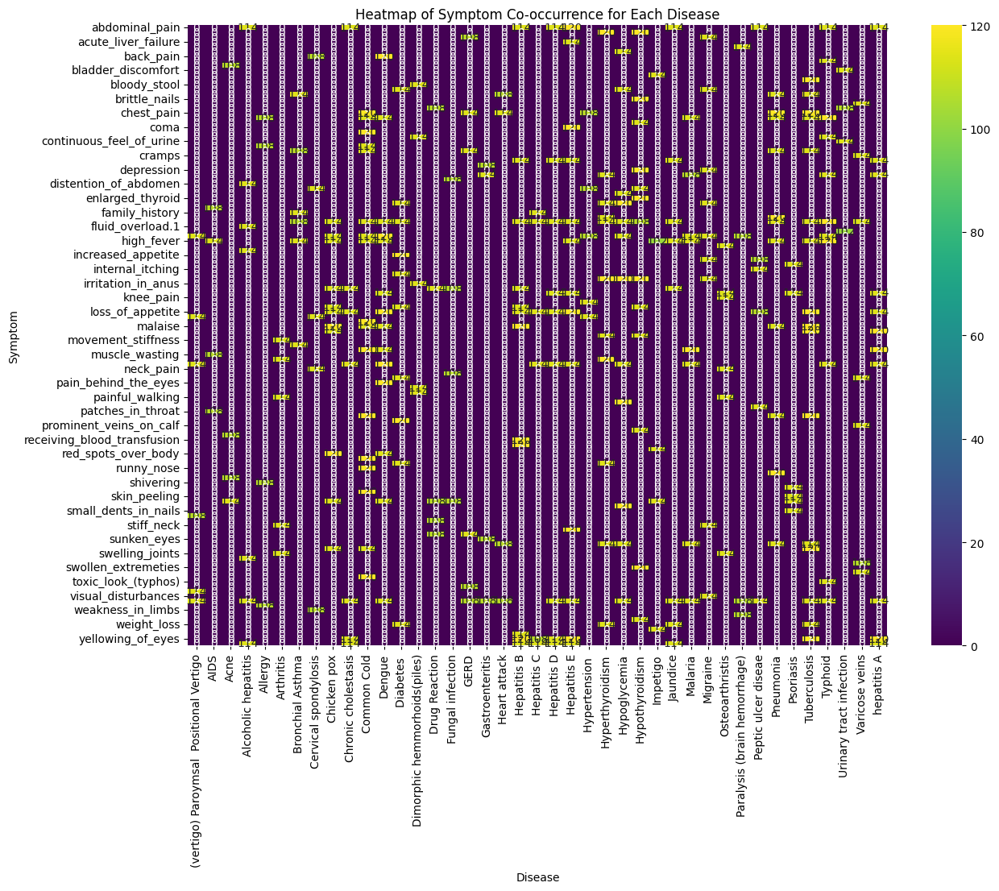

In [24]:
co_occurrence_matrix = pd.crosstab(index=symptom_df['Symptom'], columns=symptom_df['Disease'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(co_occurrence_matrix, cmap='viridis', annot=True, fmt='d')
plt.title('Heatmap of Symptom Co-occurrence for Each Disease')
plt.xlabel('Disease')
plt.ylabel('Symptom')
plt.show()

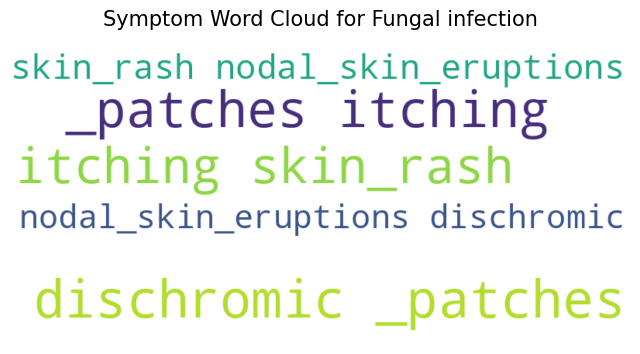

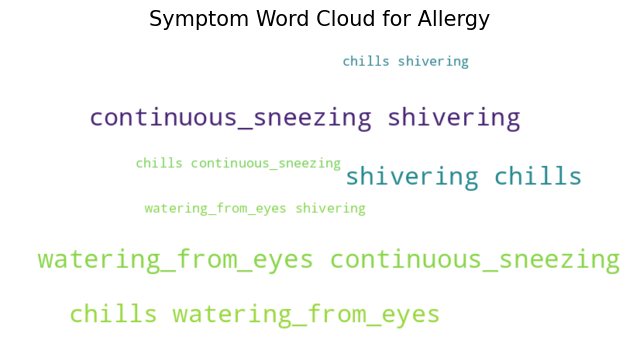

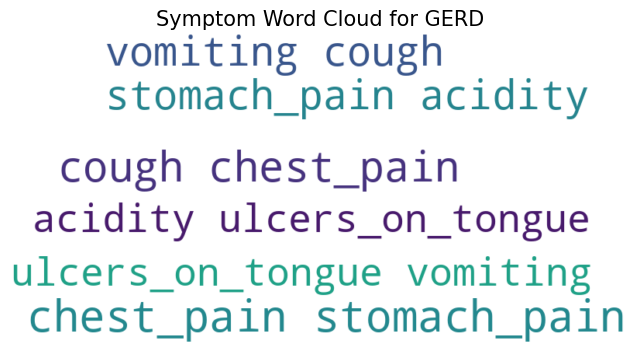

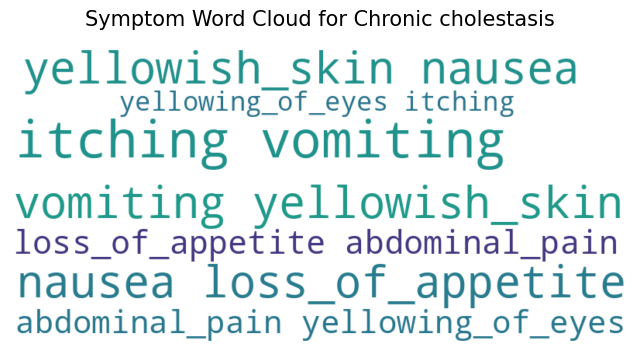

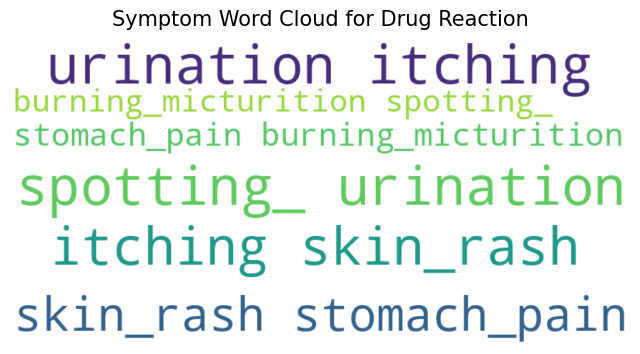

...

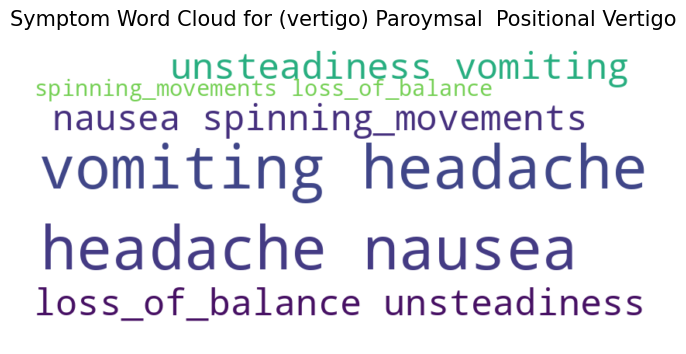

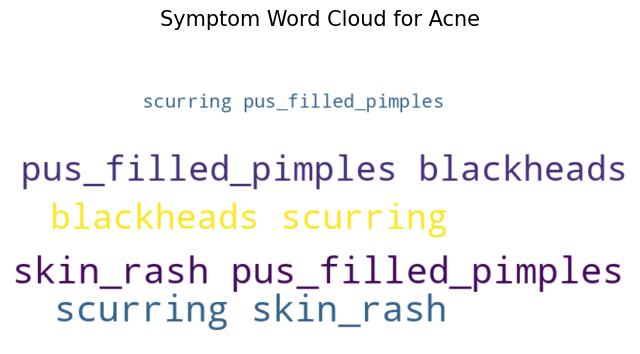

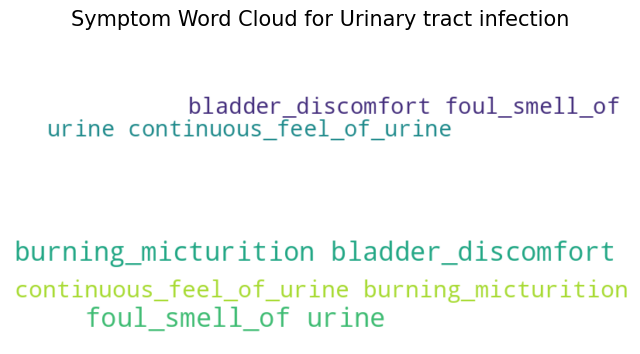

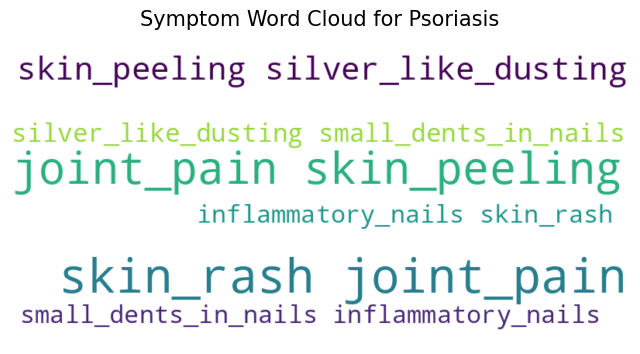

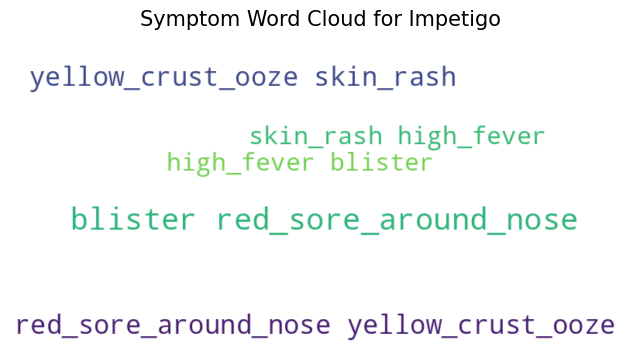

In [25]:
from wordcloud import WordCloud

# Generate word clouds for each disease
for disease in symptoms_dict.keys():
    plt.figure(figsize=(8, 6))
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(symptoms_dict[disease]))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Symptom Word Cloud for {disease}', size=15)
    plt.axis('off')
    plt.show()

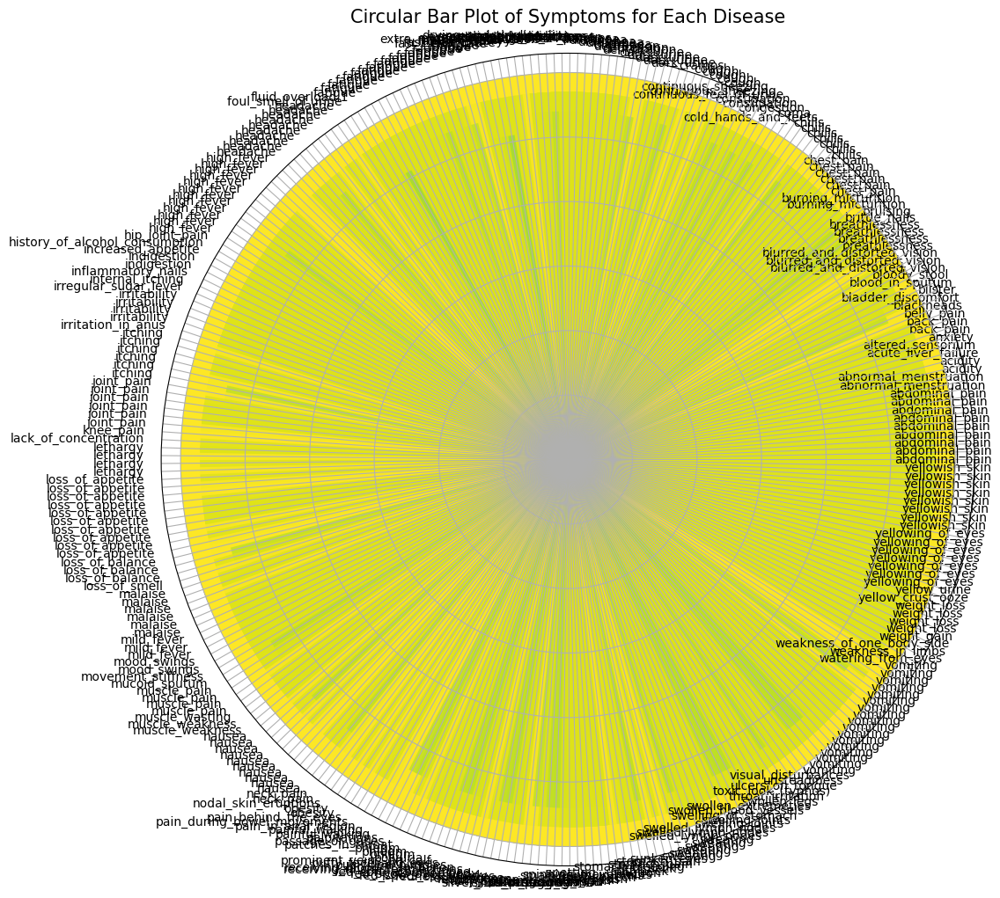

In [30]:
circular_data = symptom_df.groupby(['Symptom', 'Disease']).size().reset_index(name='Count')

# Sort data by symptom and disease
circular_data = circular_data.sort_values(by=['Symptom', 'Disease'])

# Plot the circular bar plot
plt.figure(figsize=(12, 12))
ax = plt.subplot(111, polar=True)

# Define the number of bars
N = len(circular_data)

# Create x and y variables
angles = [n / float(N) * 2 * np.pi for n in range(N)]
values = circular_data['Count'].values

# Plot bars
bars = ax.bar(angles, values, color=plt.cm.viridis(values / float(max(values))), alpha=0.8)

# Add labels
ax.set_xticks(angles)
ax.set_xticklabels(circular_data['Symptom'], size=10, rotation=90, horizontalalignment='right')
ax.set_yticklabels([])

plt.title('Circular Bar Plot of Symptoms for Each Disease', size=15)
plt.show()

In [37]:
symptom_df

,Disease,Symptom
0,Fungal infection,itching
1,Fungal infection,skin_rash
2,Fungal infection,nodal_skin_eruptions
3,Fungal infection,dischromic _patches
4,Fungal infection,skin_rash
...,...,...
36643,Impetigo,skin_rash
36644,Impetigo,high_fever
36645,Impetigo,blister
36646,Impetigo,red_sore_around_nose


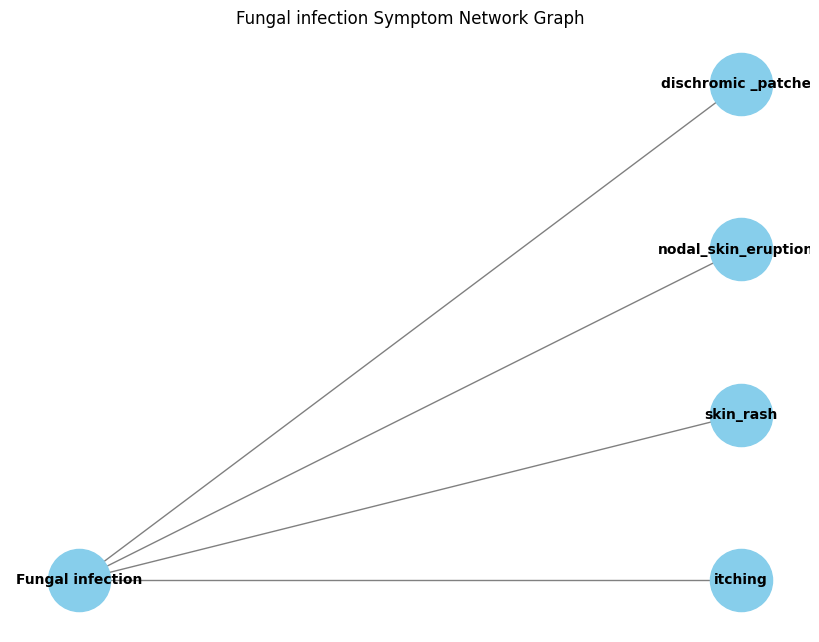

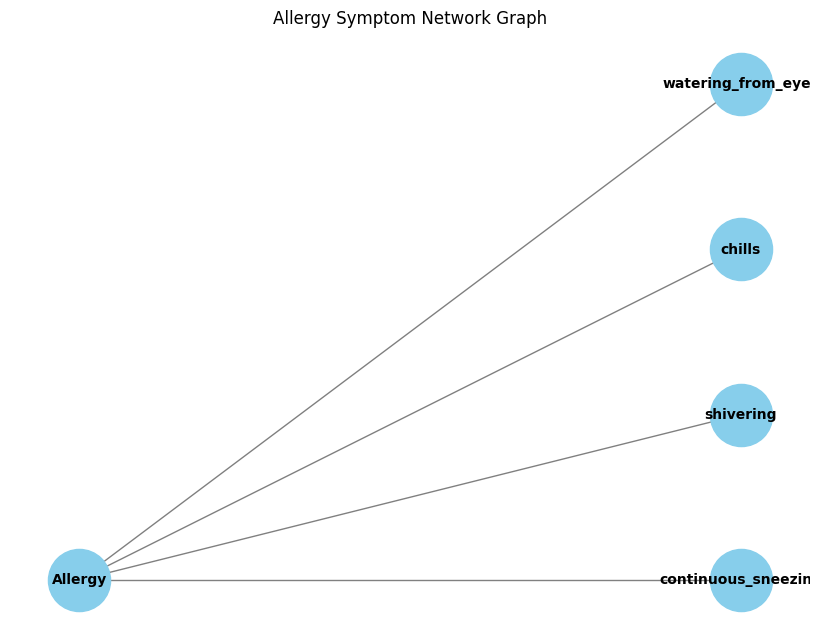

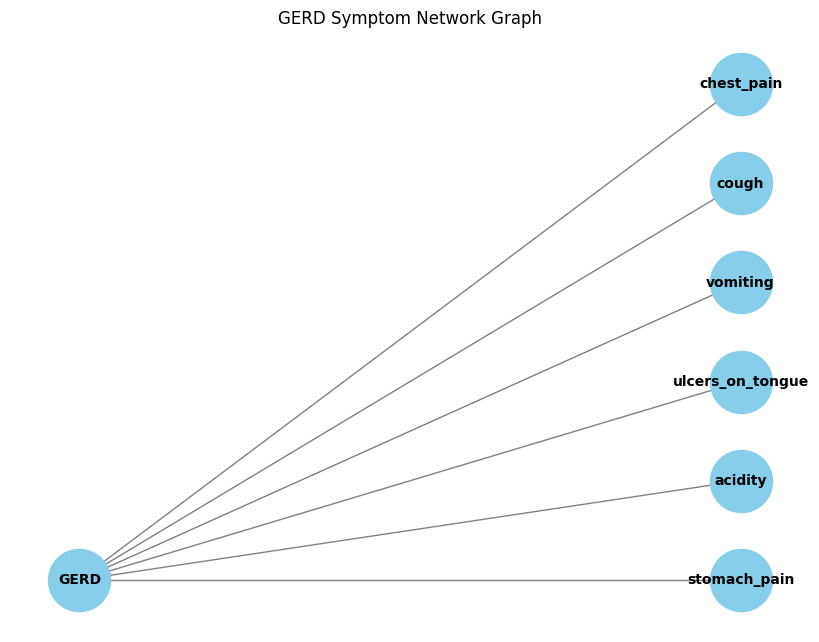

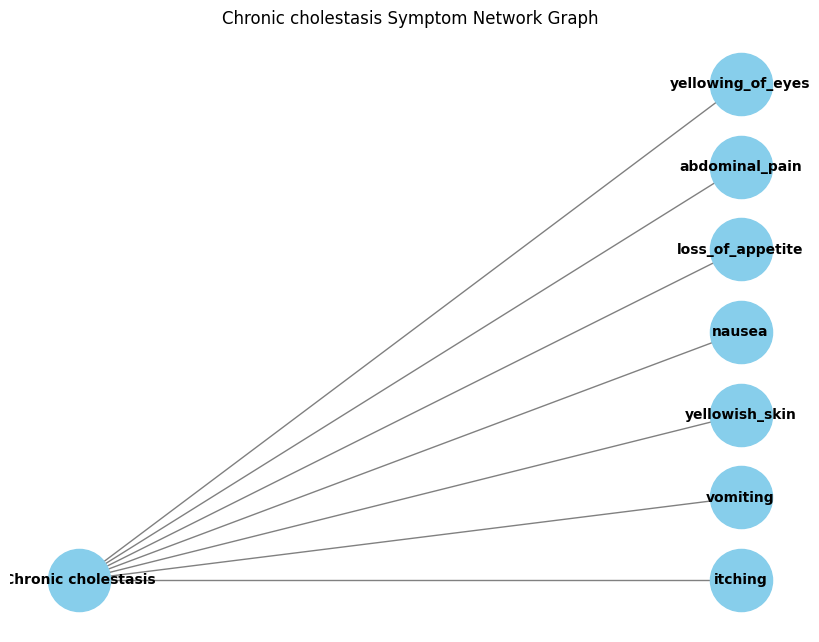

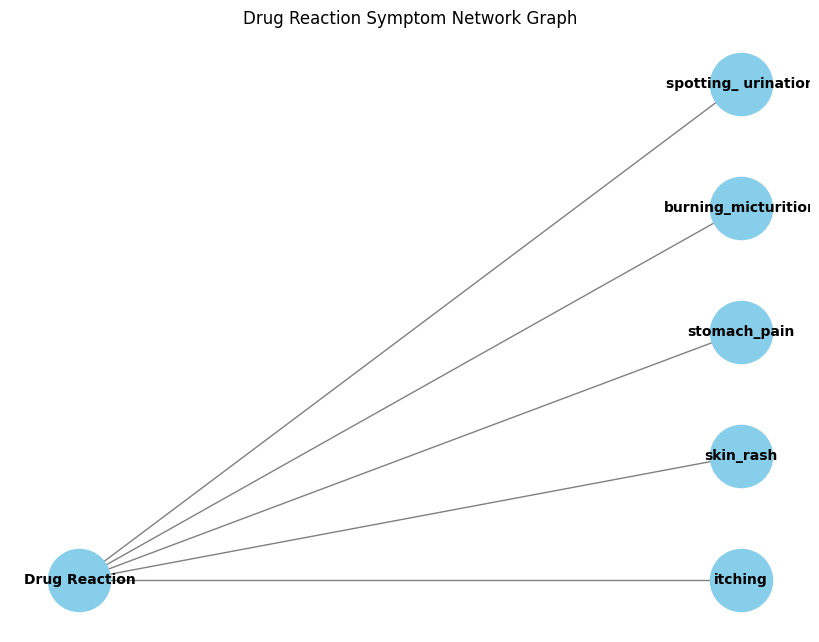

...

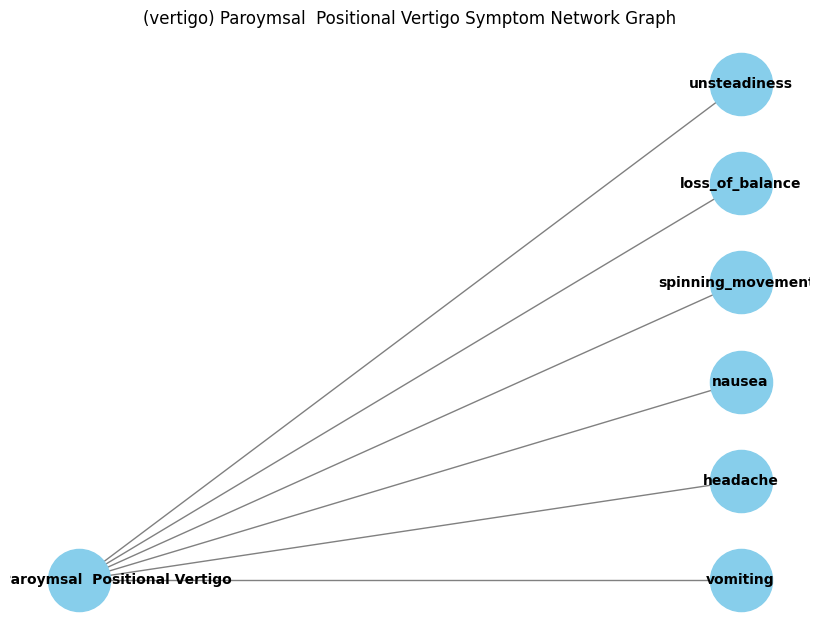

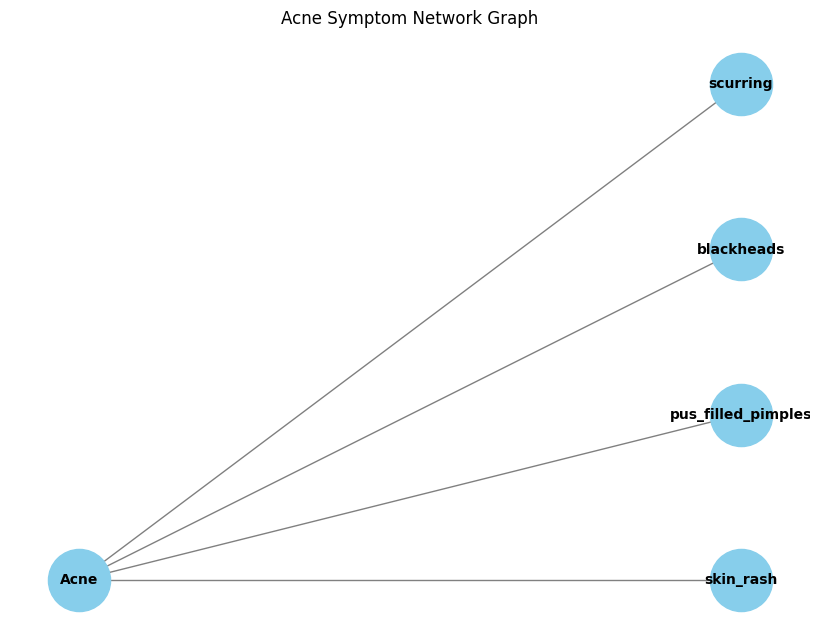

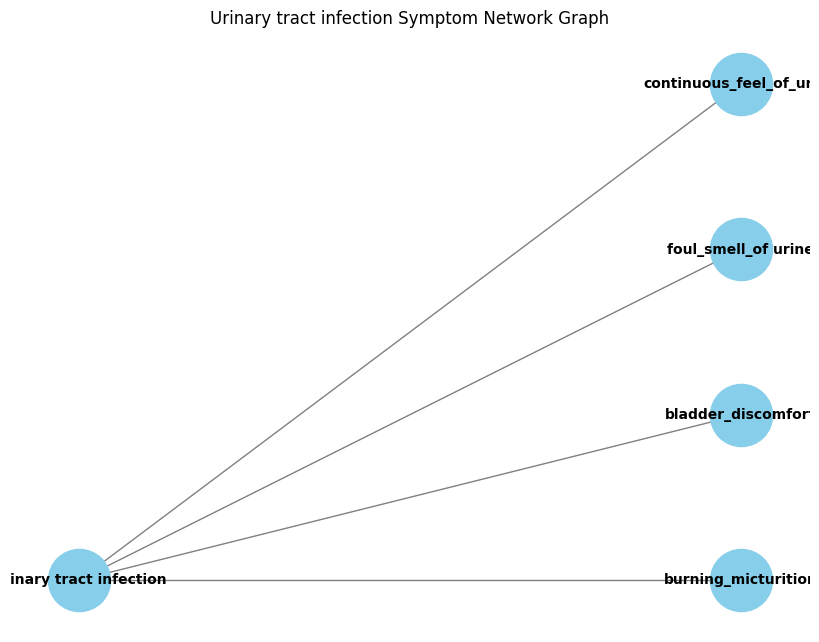

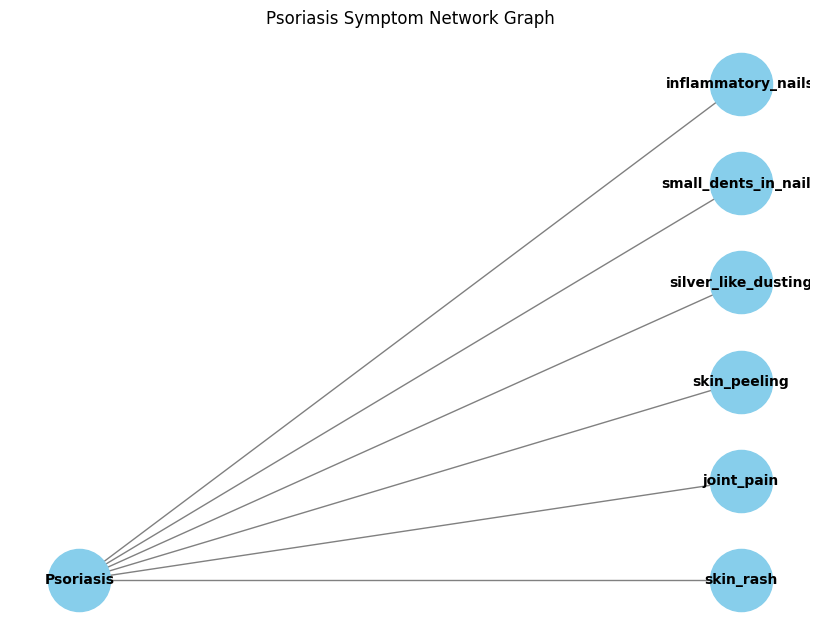

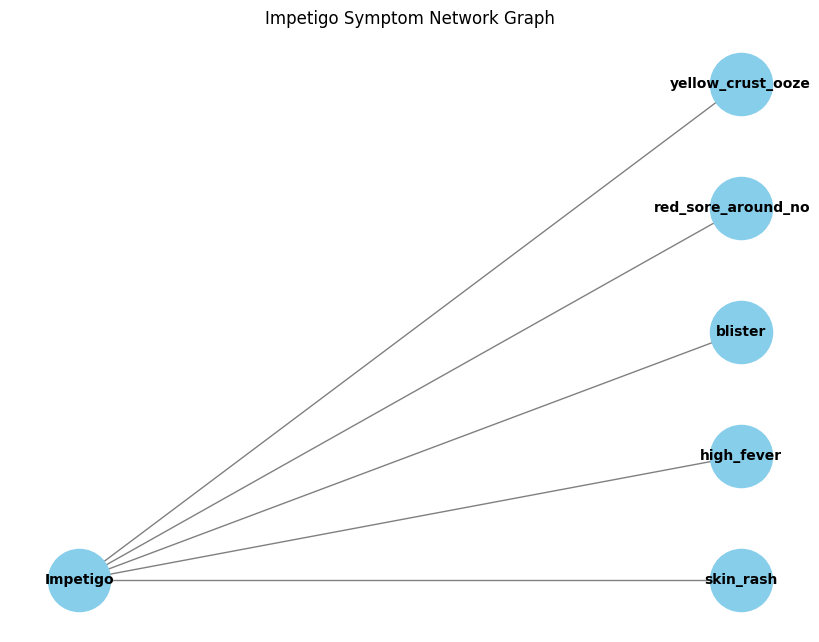

In [39]:
import networkx as nx
import matplotlib.pyplot as plt

diseases = symptom_df['Disease'].unique()

for disease in diseases:
    # Filter data for the current disease
    df_subset = symptom_df[symptom_df['Disease'] == disease]

    # Create a graph
    G = nx.Graph()

    # Add nodes for diseases and symptoms
    G.add_nodes_from(df_subset['Disease'], bipartite=0)
    G.add_nodes_from(df_subset['Symptom'], bipartite=1)

    # Add edges between diseases and symptoms
    for idx, row in df_subset.iterrows():
        G.add_edge(row['Disease'], row['Symptom'])

    # Position nodes using bipartite layout
    pos = nx.bipartite_layout(G, df_subset['Disease'])

    # Draw the graph
    plt.figure(figsize=(8, 6))
    nx.draw(G, pos, with_labels=True, node_size=2000, node_color='skyblue', font_size=10, font_weight='bold', edge_color='gray')
    plt.title(f'{disease} Symptom Network Graph')
    plt.show()